In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# !pip install fastai==2.0.19
# !pip install fastai2==0.0.30
# !pip install fastcore==1.3.1
# !pip install -Uqq fastbook

In [3]:
from fastbook import *
from fastai.vision.widgets import *
import requests
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

import requests
import matplotlib.pyplot as plt
# import PIL.Image
from io import BytesIO
import os

# from IPython.display import Image
from IPython.core.display import HTML

In [ ]:
# subscription_key="9f37b39f8077480f8be16d6b45d543b9"

# search_url = "https://api.bing.microsoft.com/v7.0/images/search"
# headers = {"Ocp-Apim-Subscription-Key" : subscription_key}

# search_term = "riot"

# #Add in count parameter so that max number of images (150) is #retrieved upon each API call. Otherwise, default is 35.
# params  = {"q": search_term, "license": "public", "imageType": "photo", "count":"150"}
# response = requests.get(search_url, headers=headers, params=params)
# response.raise_for_status()
# search_results = response.json() # Generating a json file

# # Collating the image URLs into a list
# img_urls = [img['contentUrl'] for img in search_results["value"]]

# # Get length of the img_urls list
# len(img_urls)

# dest = 'dataset/riot'

In [ ]:
# # Downloading images from the list of image URLs
# download_images(dest, urls=img_urls)

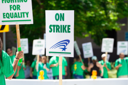

In [6]:
riot_imgs = os.listdir('/content/drive/My Drive/resistance_dataset20210504/riot')
protest_imgs = os.listdir('/content/drive/My Drive/resistance_dataset20210504/protest')
img = Image.open(f'/content/drive/My Drive/resistance_dataset20210504/protest/{protest_imgs[3]}')
img.to_thumb(128,128)

In [7]:
path = Path('/content/drive/My Drive/resistance_dataset20210504/')
fns = get_image_files(path)
fns

(#175) [Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000055.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000011.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000081.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000035.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000145.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000093.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000072.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000108.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000001.jpg'),Path('/content/drive/My Drive/resistance_dataset20210504/protest/00000099.jpg')...]

In [8]:
failed = verify_images(fns)
failed

(#0) []

In [9]:
failed.map(Path.unlink);

In [10]:
dataset = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [11]:
dls = dataset.dataloaders(path)

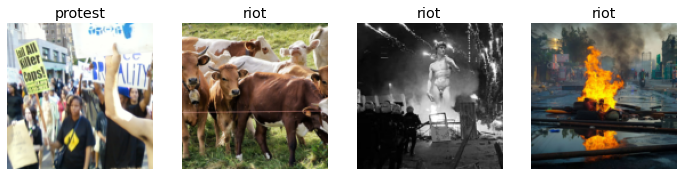

In [12]:
dls.valid.show_batch(max_n=4, nrows=1)

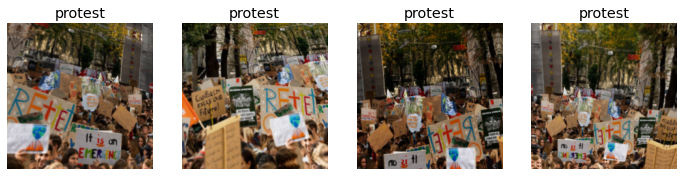

In [13]:
dataset = dataset.new(item_tfms=RandomResizedCrop(224, min_scale=0.5),
                      batch_tfms=aug_transforms())
dls = dataset.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

In [14]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.345484,5.110060,0.714286,00:11


epoch,train_loss,valid_loss,error_rate,time
0,0.951043,3.860861,0.714286,00:11
1,0.909688,2.685524,0.714286,00:11
2,0.761577,1.897645,0.571429,00:12
3,0.655014,1.331971,0.457143,00:11


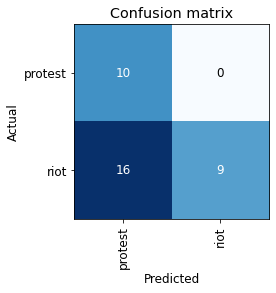

In [15]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

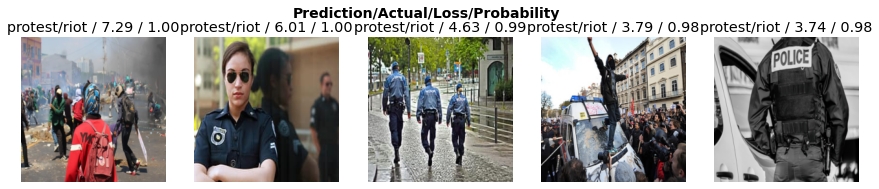

In [16]:
interp.plot_top_losses(5, nrows=1)

In [18]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [19]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [20]:
learn.export()

In [21]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [22]:
learn_inf = load_learner(path/'export.pkl')

In [23]:
learn_inf.predict(f'/content/drive/My Drive/resistance_dataset20210504/protest/{protest_imgs[3]}')

('protest', tensor(0), tensor([0.9948, 0.0052]))

In [24]:
learn_inf.dls.vocab

['protest', 'riot']

In [25]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [26]:
img = PILImage.create(btn_upload.data[-1])

In [31]:
#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img)
out_pl

Output()

In [29]:
pred,pred_idx,probs = learn_inf.predict(img)

In [30]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: protest; Probability: 0.9983')

In [43]:
floyd_path = Path('/content/drive/My Drive/floyd/')
floyd_img = get_image_files(floyd_path)
floyd_files = os.listdir(floyd_path)
floyd_img

(#17) [Path('/content/drive/My Drive/floyd/time7.jpeg'),Path('/content/drive/My Drive/floyd/time13.jpeg'),Path('/content/drive/My Drive/floyd/time10.jpeg'),Path('/content/drive/My Drive/floyd/time1.jpeg'),Path('/content/drive/My Drive/floyd/time18.jpeg'),Path('/content/drive/My Drive/floyd/time11.jpeg'),Path('/content/drive/My Drive/floyd/time2.jpeg'),Path('/content/drive/My Drive/floyd/time9.jpeg'),Path('/content/drive/My Drive/floyd/time12.jpeg'),Path('/content/drive/My Drive/floyd/time3.jpeg')...]

In [75]:
all_probs=[]
imDict ={}
for index, im in enumerate(floyd_img):
  pred,pred_idx,probs = learn_inf.predict(im)
  all_probs.append(probs[pred_idx].item())
  imDict[im] = [probs[pred_idx].item(), pred]
  print(im)
  print(f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}')

/content/drive/My Drive/floyd/time7.jpeg
Prediction: protest; Probability: 0.9813


/content/drive/My Drive/floyd/time13.jpeg
Prediction: protest; Probability: 0.9989


/content/drive/My Drive/floyd/time10.jpeg
Prediction: riot; Probability: 0.9820


/content/drive/My Drive/floyd/time1.jpeg
Prediction: protest; Probability: 0.9983


/content/drive/My Drive/floyd/time18.jpeg
Prediction: protest; Probability: 0.5030


/content/drive/My Drive/floyd/time11.jpeg
Prediction: riot; Probability: 0.6163


/content/drive/My Drive/floyd/time2.jpeg
Prediction: protest; Probability: 0.9999


/content/drive/My Drive/floyd/time9.jpeg
Prediction: protest; Probability: 0.9112


/content/drive/My Drive/floyd/time12.jpeg
Prediction: protest; Probability: 0.9952


/content/drive/My Drive/floyd/time3.jpeg
Prediction: protest; Probability: 0.8958


/content/drive/My Drive/floyd/time14.jpeg
Prediction: protest; Probability: 0.9990


/content/drive/My Drive/floyd/time5.jpeg
Prediction: protest; Probability: 0.9924


/content/drive/My Drive/floyd/time8.jpeg
Prediction: protest; Probability: 0.9945


/content/drive/My Drive/floyd/time4.jpeg
Prediction: protest; Probability: 0.9905


/content/drive/My Drive/floyd/time15.jpeg
Prediction: protest; Probability: 0.9503


/content/drive/My Drive/floyd/time6.jpeg
Prediction: protest; Probability: 0.8053


/content/drive/My Drive/floyd/time17.jpeg
Prediction: protest; Probability: 0.9460


In [77]:
import numpy as np
from sklearn import preprocessing

all_probs = np.array(all_probs)
print(all_probs)
# norm_probs = preprocessing.normalize([all_probs])

for key, value in imDict.items(): imDict[key] = [np.exp(-(1-value[0])), value[1]]
print(imDict)

[0.98129672 0.99894506 0.98200154 0.99829024 0.50300604 0.61633575 0.99986672 0.91123706 0.99521554 0.89577782 0.9989925  0.99240488 0.99452978 0.99052459 0.95029086 0.8053484  0.94600379]
{Path('/content/drive/My Drive/floyd/time7.jpeg'): [0.9816411541689603, 'protest'], Path('/content/drive/My Drive/floyd/time13.jpeg'): [0.998946169318425, 'protest'], Path('/content/drive/My Drive/floyd/time10.jpeg'): [0.9823206935260854, 'riot'], Path('/content/drive/My Drive/floyd/time1.jpeg'): [0.9982931598815128, 'protest'], Path('/content/drive/My Drive/floyd/time18.jpeg'): [0.6759451528372272, 'protest'], Path('/content/drive/My Drive/floyd/time11.jpeg'): [0.7271373844608907, 'riot'], Path('/content/drive/My Drive/floyd/time2.jpeg'): [0.999866741774798, 'protest'], Path('/content/drive/My Drive/floyd/time9.jpeg'): [0.9185696688811613, 'protest'], Path('/content/drive/My Drive/floyd/time12.jpeg'): [0.9952383353259986, 'protest'], Path('/content/drive/My Drive/floyd/time3.jpeg'): [0.9057654305086